#### **Найти коэффициент лобового сопротивления парашютиста, пользуясь методом дихотомии.**

In [74]:
import numpy as np
import matplotlib.pyplot as plt

Выпишем II закон Ньютона для парашютиста:

In [75]:
def parachute(c, m=68.1, v=40, t=10):
    g = 9.8
    return v - g * m / c * (1 - np.e ** (-(c / m)*t))

Суть метода заключается в том, чтобы последовательно сужать промежуток, на котором, по нашему мнению, находится корень, пока промежуток не станет совсем маленьким.

Обозначим границы:

In [76]:
a = 1
b = 1000

Вынесем метод в функцию, чтобы иметь возможность использовать его в дальнейшем:

In [77]:
def bisection(a, b, func):
    eps = 1e-10

    while b - a > eps:
        c = (a + b) / 2
        if func(a) * func(c) < 0: b = c
        else: a = c

    return c

Получим ответ:

In [78]:
bisection(a, b, parachute)

14.780203831679898

#### **Найти положительный корень уравнения, используя различные методы нахождения действительных корней. Сравнить.**

Уравнение:

In [79]:
def f_1(x):
    return 4*(1 - x**2) - np.e**x

Известно, что f(x) должно быть равно 0, а х принадлежит промежутку [0, 1]

Попробуем это визуализировать:

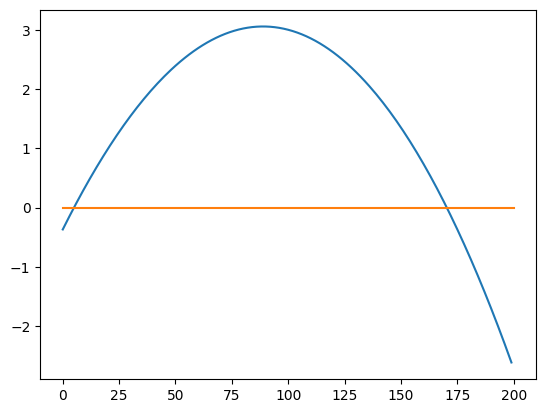

In [100]:

x = np.arange(-1, 1, 0.01)
plt.plot(f_1(x))

line_x = [0, 200]
line_y = [0, 0]
plt.plot(line_x, line_y)

plt.show()

#### *Метод Ньютона:*

Для начала, используем метод в сочетании с методом бисекции:

In [81]:
x0_1 = bisection(0, 1, f_1)

x0_1

0.7034395711380057

Также, нам понадобится функция для нахождения производной. Можно сделать это по определению:

In [82]:
def derivative(x, func):
    h = 1e-5
    
    return (func(x+h)-func(x))/h

Вынесем алгоритм нахождения следующего х в рекурсивную функцию:

In [83]:
def newton(x0, func):
    return x0 - func(x0)/derivative(x0, func)

Как только разница между двумя соседними значениями становится меньше эпсилон, считаем корень найденным.

In [84]:
xi_N = x0_1
xi1_N = newton(x0_1, f_1)
eps = 1e-10
iterations = 1

print(xi1_N, f_1(xi1_N))

while abs(xi_N - xi1_N) > eps:
    iterations += 1
    xi_N = xi1_N
    xi1_N = newton(xi_N, f_1)
    print(xi1_N, f_1(xi1_N))

print(iterations)

0.7034395711636393 1.7763568394002505e-15
1


#### *Метод секущих*

Для того, чтобы избежать вычисления производной, используем двухшаговый метод:

In [85]:
def secant(x0, x1, func):
    return x1 - ((x1 - x0) / (func(x1) - func(x0))) * func(x1)

Для использования этого метода, нужно знать два базовых значения. Используем x0, полученный с помощью метода бисекции, и х1, полученный благодаря методу Ньютона.

In [86]:
xi_S = x0_1
xi1_S = newton(x0_1, f_1)
xi2_S = secant(xi_S, xi1_S, f_1)
iterations = 1

print(xi2_S, f_1(xi2_S))

while abs(xi1_S - xi2_S) > eps:
    iterations += 1
    xi_S = xi1_S
    xi1_S = xi2_S
    xi2_S = secant(xi_S, xi1_S, f_1)
    print(xi2_S, f_1(xi2_S))

print(iterations)

0.7034395711636395 0.0
1


#### *Метод Стеффенсена*

Данный метод мешает обе проблемы: он не требует вычисления производной, и при этом является одношаговым и требует знания исключительно значения х0.

In [87]:
def steffensen(x0, func):
    return x0 - (func(x0)/(func(x0 + func(x0)) - func(x0))) * func(x0)

Проверим:

In [88]:
xi_St = x0_1
xi1_St = steffensen(x0_1, f_1)
iterations = 1

In [89]:
print(xi1_St, f_1(xi1_St))

while abs(xi_St - xi1_St) > eps:
    iterations += 1
    xi_St = xi1_St
    xi1_St = steffensen(xi_St, f_1)
    print(xi1_St, f_1(xi1_St))

print(iterations)

0.7034395711636395 0.0
1


Как можно заметить, подобное "упрощение" заставляет метод достаточно весомо терять в эффективности.

Посмотрим на то, как сходится метод при различных х0:

In [90]:
xi_St = 0.91
xi1_St = steffensen(0.91, f_1)
iterations = 1

In [91]:
print(xi1_St, f_1(xi1_St))

while abs(xi_St - xi1_St) > eps:
    iterations += 1
    xi_St = xi1_St
    xi1_St = steffensen(xi_St, f_1)
    print(xi1_St, f_1(xi1_St))

print(iterations)

-0.5314161616234799 2.2826154528034053
-0.2119778067414022 3.011278986467964
-0.018174935334338227 3.0166894541852876
0.1471766179730187 2.7547976052613956
0.29700502056355 2.3013300148238844
0.433685959444312 1.7047317062268288
0.552389663415071 1.0420627770080033
0.6418608652206466 0.45204525855486155
0.6902324521177621 0.10013761766463203
0.702718667898819 0.005511014105583634
0.703437314364418 1.7260443547773008e-05
0.7034395711414578 1.6965007176850122e-10
0.7034395711636395 0.0
13


In [92]:
xi_St = 0.92
xi1_St = steffensen(0.92, f_1)
iterations = 1

In [93]:
print(xi1_St, f_1(xi1_St))

while abs(xi_St - xi1_St) > eps:
    iterations += 1
    xi_St = xi1_St
    xi1_St = steffensen(xi_St, f_1)
    print(xi1_St, f_1(xi1_St))

print(iterations)

-1.1724156858218242 -1.8078522585404213
-1.0626330411362026 -0.862300698306421
-0.9890498881702717 -0.28480862335693297
-0.9564182054315826 -0.04320992340804458
-0.9506167379509383 -0.0011913090144751726
-0.9504518149766475 -9.379057221980958e-07
-0.9504516850197474 -5.820899318109696e-13
-0.9504516850196667 4.440892098500626e-16
8


#### **Найти решение уравнения, используя обычный и утончённый методы Ньютона. Сравнить.**

Уравнение:

In [94]:
def f_2(x):
    return (x ** 2) * (np.e ** x)

Известно, что f(x) должно быть равно 0, а х0 = 1.

In [95]:
x0_2 = 1

Использовав кратность корня m = 2, получим следующее приближение:

In [96]:
def refined_newton(x0, func, m):
    return x0 - m * func(x0) / derivative(x0, func)

Получим уточнение:

In [97]:
xi_rN = x0_2
xi1_rN = refined_newton(x0_2, f_2, 2)
eps = 1e-15
iterations = 1

print(xi1_rN, f_2(xi1_rN))

while abs(xi_rN - xi1_rN) > eps:
    iterations += 1
    xi_rN = xi1_rN
    xi1_rN = newton(xi_rN, f_2)
    print(xi1_rN, f_2(xi1_rN))

print(iterations)

0.3333411110700264 0.15507648992627343
0.19048427432715034 0.043897978831485905
0.10352729887741097 0.011886968193893347
0.054313991551042724 0.0031146676173492787
0.02787762958509169 0.000799132488589607
0.01413300220893327 0.00020258474474546632
0.007118620220558773 5.103677518939346e-05
0.0035744498078402465 1.2822442790251627e-05
0.0017929187920527436 3.2203264057545893e-06
0.0008997598332228807 8.102965018300029e-07
0.00045257064334570956 2.0491290380106825e-07
0.0002288103217398129 5.236614387821746e-08
0.00011686535145325892 1.3659106553310557e-08
6.083380357932963e-05 3.7009767955758328e-09
3.272810075121182e-05 1.07116363535918e-09
1.8533075801619573e-05 3.4348126437389783e-10
1.1235496847013334e-05 1.2623780773576948e-10
7.347884491337474e-06 5.399180322211378e-11
5.161649732369264e-06 2.664276547993609e-11
3.850724473671676e-06 1.482813607109054e-11
3.013057550739817e-06 9.07854315820203e-12
2.4465809081387357e-06 5.985772784728462e-12
2.044671901111987e-06 4.180691731331079

Применим обычный метод Ньютона, чтобы в последствии сравнить результаты:

In [98]:
xi_N = x0_2
xi1_N = newton(x0_2, f_2)
eps = 1e-15
iterations = 1

print(xi1_N, f_2(xi1_N))

while abs(xi_N - xi1_N) > eps:
    iterations += 1
    xi_N = xi1_N
    xi1_N = newton(xi_N, f_2)
    print(xi1_N, f_2(xi1_N))

print(iterations)

0.6666705555350132 0.8656730396218169
0.41667305551878003 0.26335989691023703
0.2442603622858618 0.07617052015132302
0.13542557598800453 0.020999838903917878
0.07200984120337567 0.00557259117829883
0.037258892473438096 0.0014409244609891896
0.018972745548514802 0.0003668597985071226
0.009578064474611457 9.262222571137777e-05
0.0048143802184841995 2.329011487698152e-05
0.0024154801509985876 5.848654620626357e-06
0.0012116978093095886 1.469991688100148e-06
0.0006087084818328812 3.707516268425765e-07
0.00030692799108295054 9.423371023541117e-08
0.00015594823066735947 2.4323643581701596e-08
8.040291367779836e-05 6.465148323745251e-09
4.2556902667410664e-05 1.8111670406628588e-09
2.3516161282541165e-05 5.53022846288022e-10
1.3819923702935774e-05 1.9099293064445657e-10
8.745848611505468e-06 7.649053690710275e-11
5.963594405559164e-06 3.556467032665313e-11
4.341679019354899e-06 1.8850258548700904e-11
3.3327613960322303e-06 1.1107335540920118e-11
2.666284851232522e-06 7.109093862756035e-12
2.2

Как можно заметить, на подобных, довольно сложных для уточнения, функциях разница в точности видна - хоть и не большая.